# Download

https://mapreader.readthedocs.io/en/latest/User-guide/Download.html

In [1]:
from mapreader import SheetDownloader

my_ts = SheetDownloader(
    metadata_path="../../NLS_metadata/metadata_OS_One_Inch_GB_WFS_light.json",
    download_url="https://geo.nls.uk/maps/os/1inch_2nd_ed/{z}/{x}/{y}.png",
)

[INFO] Metadata file has 480 item(s).


[WARNING] Cartopy is not installed. If you would like to install it, please follow instructions at https://scitools.org.uk/cartopy/docs/latest/installing.html


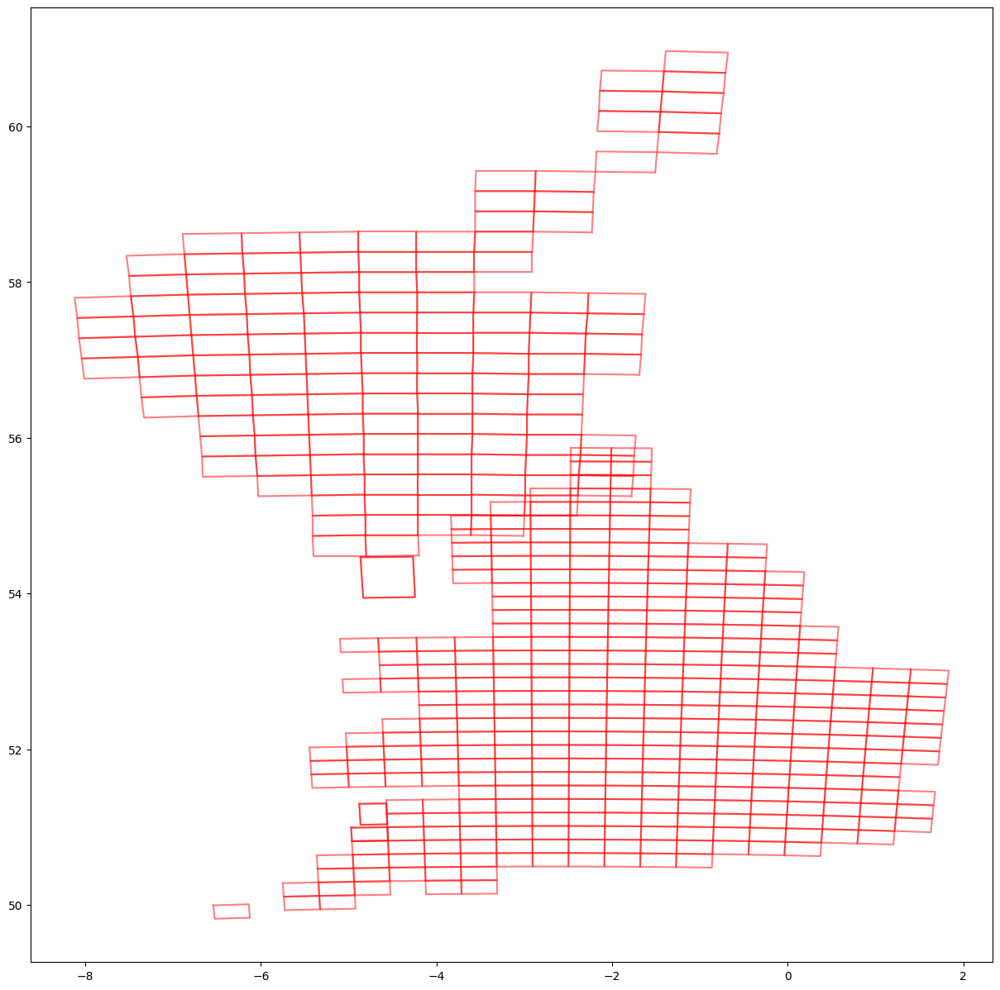

In [2]:
my_ts.extract_wfs_id_nos()
my_ts.plot_all_metadata_on_map(map_extent="uk", add_id=False)

In [3]:
my_ts.get_minmax_latlon()

[INFO] Min lat: 49.82091681, max lat: 60.97000003 
[INFO] Min lon: -8.11999993, max lon: 1.83188116


1873 1909 36


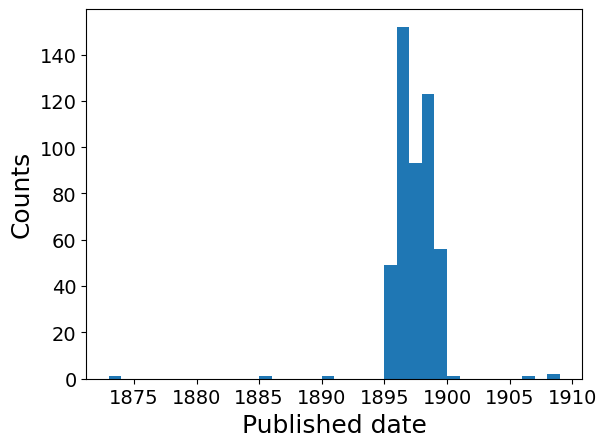

In [4]:
my_ts.extract_published_dates()
my_ts.hist_published_dates()


## Query maps using a list of lats/lons

In [5]:
my_ts.query_map_sheets_by_coordinates((-4.33, 55.90))
my_ts.query_map_sheets_by_coordinates((-3.25, 51.93), append=True)

In [6]:
my_ts.print_found_queries()

Query results:
URL:     	https://maps.nls.uk/view/74488689
coordinates (bounds):  	(-4.82999994, 55.79000003, -4.20999993, 56.05000003)
--------------------
URL:     	https://maps.nls.uk/view/101168342
coordinates (bounds):  	(-3.33544762, 51.87891401, -2.91228731, 52.05404182)
--------------------


[WARNING] Cartopy is not installed. If you would like to install it, please follow instructions at https://scitools.org.uk/cartopy/docs/latest/installing.html


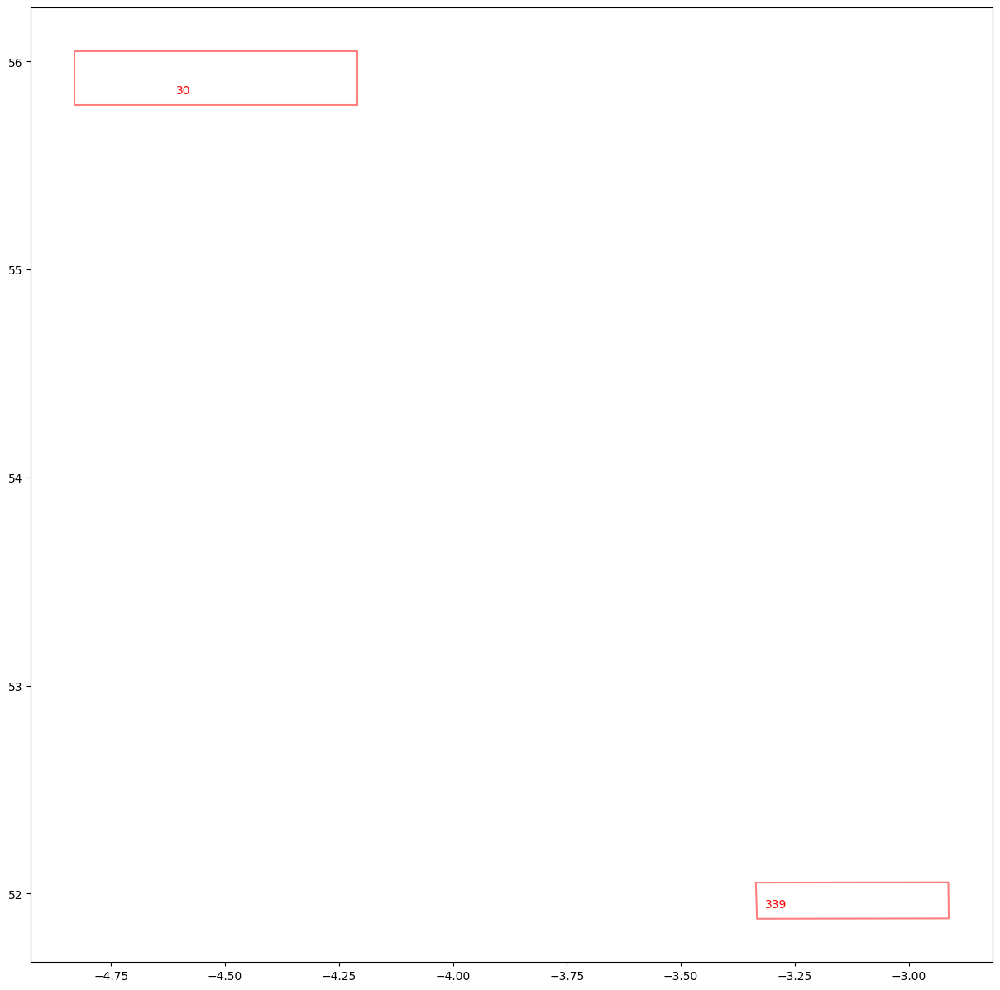

In [7]:
my_ts.plot_queries_on_map(map_extent="uk")

## Download map tiles

In [8]:
my_ts.get_grid_bb(zoom_level=14)
my_ts.download_map_sheets_by_queries(overwrite=True)

  0%|          | 0/2 [00:00<?, ?it/s]

[INFO] Downloaded "map_74488689.png"
[INFO] Downloaded "map_101168342.png"


# Load

https://mapreader.readthedocs.io/en/latest/User-guide/Load.html

## Load in downloaded maps

In [1]:
from mapreader import loader

In [2]:
my_files = loader("./maps/*png")

  0%|          | 0/2 [00:00<?, ?it/s]

In [3]:
# len() shows the total number of images currently read (or sliced, see below)
print(f"Number of images: {len(my_files)}")

Number of images: 2


In [4]:
print(my_files)

#images: 2

#parents: 2
map_74488689.png
map_101168342.png

#patches: 0



In [5]:
my_files.add_metadata("./maps/metadata.csv")

In [25]:
parent_list = my_files.list_parents()
patch_list = my_files.list_patches()

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 1 Axes>]

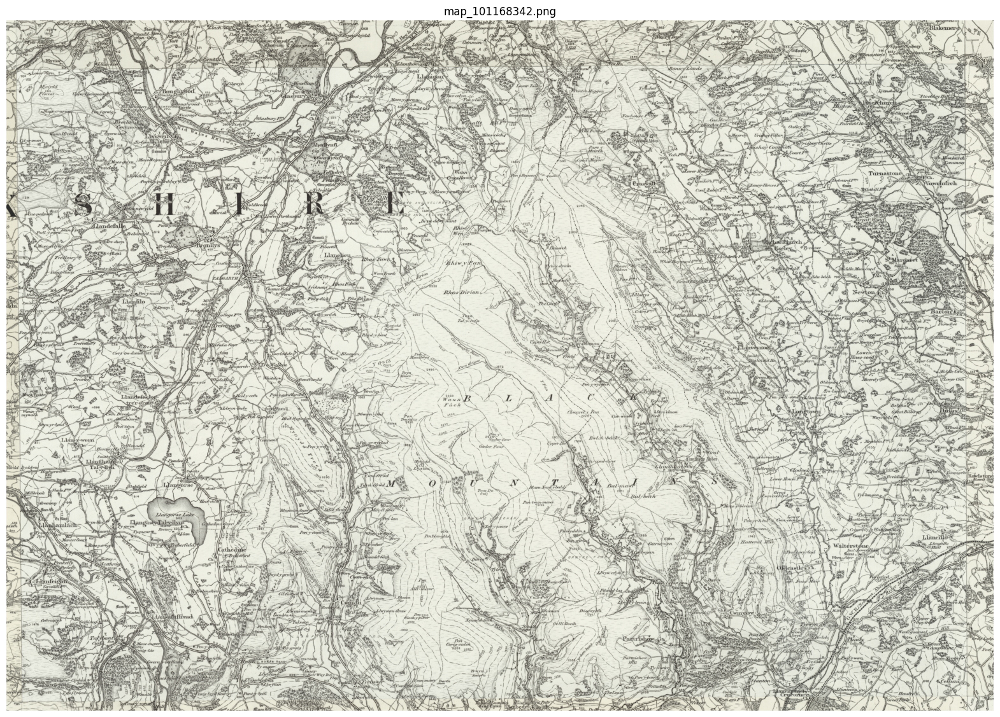

In [7]:
my_files.show(parent_list[1], figsize=(20, 20))

## Patchify maps

In [8]:
my_files.patchify_all(patch_size=1000)  # in pixels

[INFO] Saving patches in directory named "patches_1000_pixel".


  0%|          | 0/2 [00:00<?, ?it/s]

maps/map_74488689.png
maps/map_101168342.png


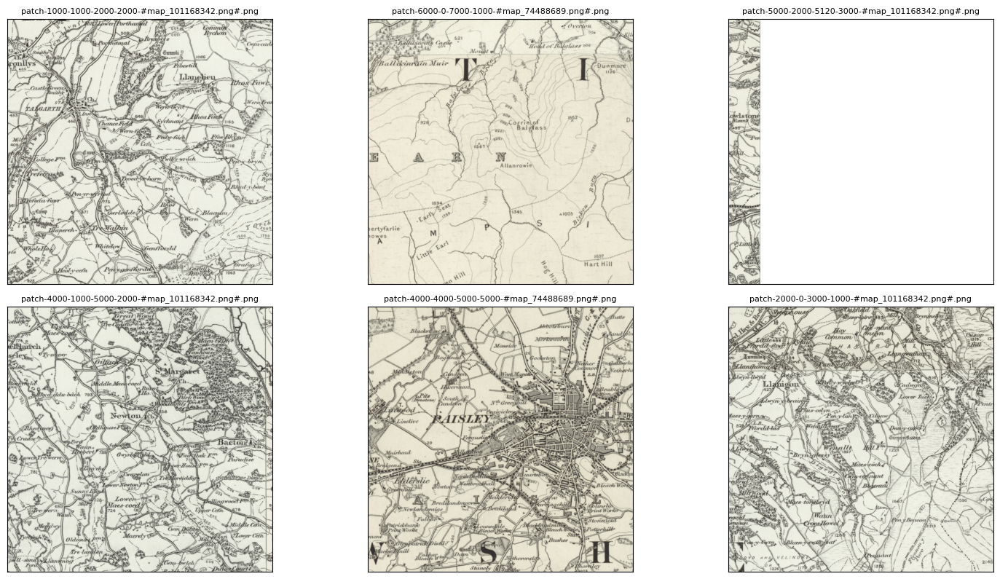

In [9]:
my_files.show_sample(num_samples=6, tree_level="patch")

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 1500x1500 with 1 Axes>]

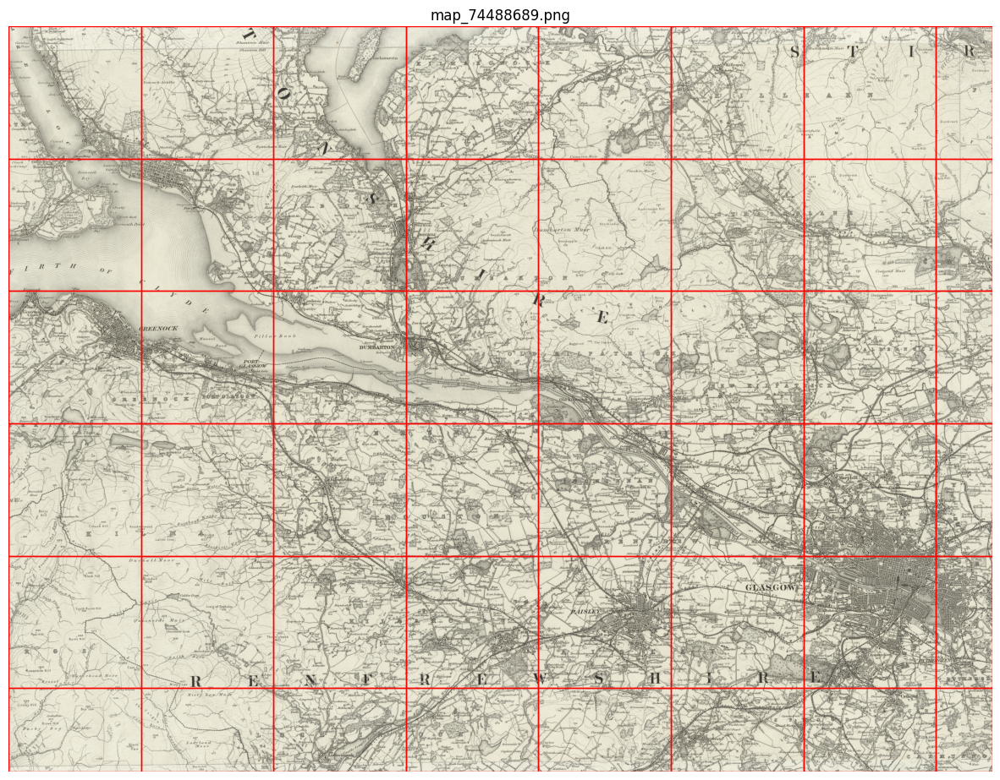

In [10]:
my_files.show_parent(
    parent_list[0], patch_border=True, plot_parent=True, figsize=(15, 15)
)

In [11]:
my_files.add_coord_increments()

[INFO] Add coord-increments, tree level: parent


In [12]:
parent_df, patch_df = my_files.convert_images(save=True)

[INFO] Saved parent dataframe as "parent_df.csv"
[INFO] Saved patch dataframe as "patch_df.csv"


In [13]:
parent_df.head()

,parent_id,image_path,shape,name,url,coordinates,crs,published_date,grid_bb,patches,dlon,dlat
image_id,,,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(5632, 7424, 4)",map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","[patch-0-0-1000-1000-#map_74488689.png#.png, p...",0.000086,0.000048
map_101168342.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3584, 5120, 4)",map_101168342.png,https://maps.nls.uk/view/101168342,"(-3.33984375, 51.87649097061476, -2.900390625,...",EPSG:4326,1896,"[(14, 8040, 5407)x(14, 8059, 5420)]","[patch-0-0-1000-1000-#map_101168342.png#.png, ...",0.000086,0.000053


In [14]:
patch_df.head()

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon
image_id,,,,,,,
patch-0-0-1000-1000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1000, 1000, 4)","(0, 0, 1000, 1000)","(-4.833984375, 56.01167989721488, -4.748153686...",EPSG:4326,POLYGON ((-4.7481536865234375 56.0116798972148...
patch-0-1000-1000-2000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1000, 1000, 4)","(0, 1000, 1000, 2000)","(-4.833984375, 55.96359031532321, -4.748153686...",EPSG:4326,POLYGON ((-4.7481536865234375 55.9635903153232...
patch-0-2000-1000-3000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1000, 1000, 4)","(0, 2000, 1000, 3000)","(-4.833984375, 55.91550073343153, -4.748153686...",EPSG:4326,POLYGON ((-4.7481536865234375 55.9155007334315...
patch-0-3000-1000-4000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1000, 1000, 4)","(0, 3000, 1000, 4000)","(-4.833984375, 55.86741115153985, -4.748153686...",EPSG:4326,POLYGON ((-4.7481536865234375 55.8674111515398...
patch-0-4000-1000-5000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1000, 1000, 4)","(0, 4000, 1000, 5000)","(-4.833984375, 55.81932156964817, -4.748153686...",EPSG:4326,POLYGON ((-4.7481536865234375 55.8193215696481...


## Detect text

Here, we show how to load an already trained/fine-tuned text detection model and run the model inference on your patches. DeepSolo is a text detection and recognition framework so it produces bounding boxes, OCR text outputs and scores.

### Set up the DeepSoloRunner

In [15]:
from mapreader import DeepSoloRunner

In [32]:
# change these to your own paths, see the README for more details on how to get these
cfg_file = "/Users/rwood/projects/DataCulture/ocr_test/detectron2_etc/DeepSolo/configs/R_50/IC15/finetune_150k_tt_mlt_13_15_textocr.yaml"
weights_file = "/Users/rwood/projects/DataCulture/ocr_test/detectron2_etc/ic15_res50_finetune_synth-tt-mlt-13-15-textocr.pth"

In [21]:
my_runner = DeepSoloRunner(
    patch_df[:10], # only the first 10 to save time
    parent_df,
    cfg_file = cfg_file,
    weights_file = weights_file,
)

### Run on all patches in the patch dataframe

Note: we've only loaded the first 10 rows of our patch dataframe to save time

In [23]:
patch_predictions = my_runner.run_all(return_dataframe=True)

In [24]:
patch_predictions.head()

,image_id,polygon,text,score
0,patch-0-0-1000-1000-#map_74488689.png#.png,POLYGON ((52.80828094482422 112.66488647460938...,CARNBAN,0.80
1,patch-0-0-1000-1000-#map_74488689.png#.png,"POLYGON ((76.12000274658203 375.7830505371094,...",RAHAEN,0.78
2,patch-0-0-1000-1000-#map_74488689.png#.png,"POLYGON ((10.01697826385498 302.4422302246094,...",GREENTEE,0.64
3,patch-0-0-1000-1000-#map_74488689.png#.png,"POLYGON ((93.5757064819336 140.6866912841797, ...",POINT,0.76
4,patch-0-0-1000-1000-#map_74488689.png#.png,"POLYGON ((221.7550048828125 416.7247314453125,...",FIREE,0.64


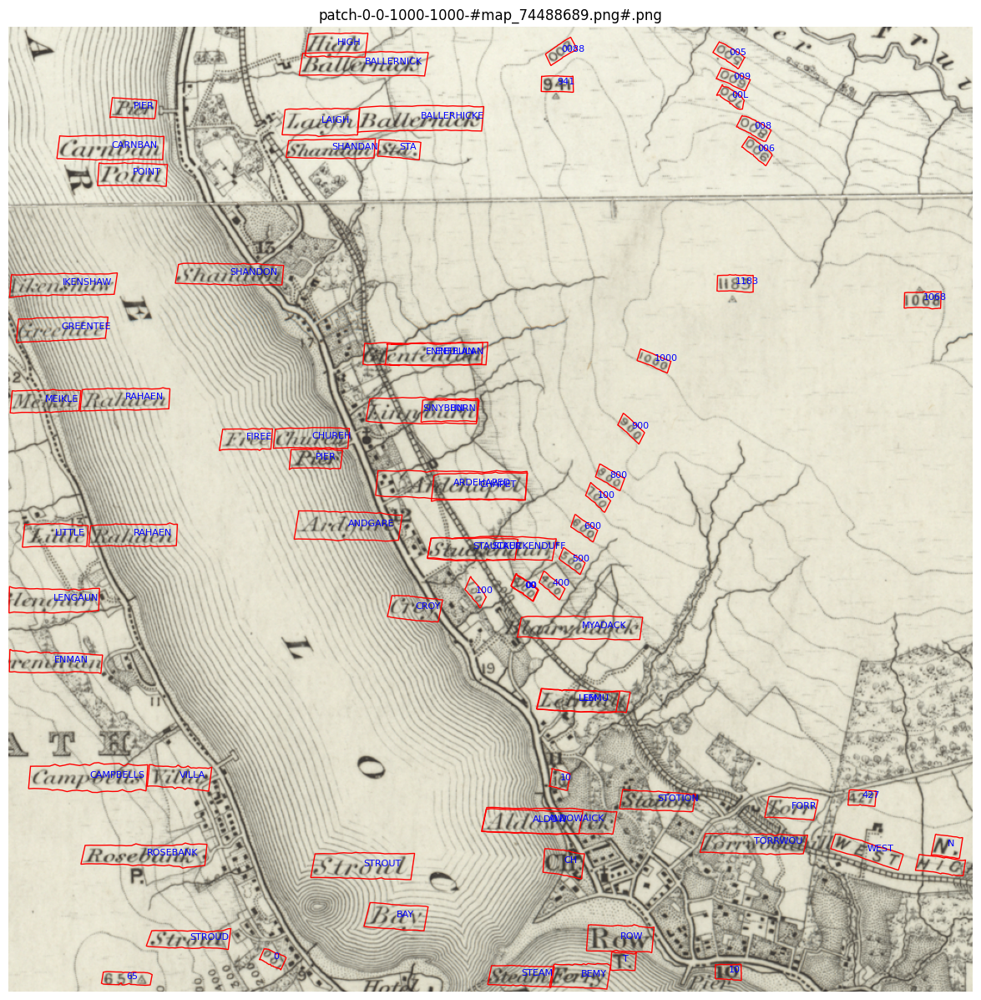

In [28]:
my_runner.show(
    patch_list[0], 
    figsize=(15, 15),
    border_color="r",
    text_color="b",
    )

### Scale up to parent images

In [29]:
parent_predictions = my_runner.convert_to_parent_pixel_bounds(return_dataframe=True)

In [30]:
parent_predictions.head()

,image_id,polygon,text,score
0,map_74488689.png,POLYGON ((52.80828094482422 112.66488647460938...,CARNBAN,0.80
1,map_74488689.png,"POLYGON ((76.12000274658203 375.7830505371094,...",RAHAEN,0.78
2,map_74488689.png,"POLYGON ((10.01697826385498 302.4422302246094,...",GREENTEE,0.64
3,map_74488689.png,"POLYGON ((93.5757064819336 140.6866912841797, ...",POINT,0.76
4,map_74488689.png,"POLYGON ((221.7550048828125 416.7247314453125,...",FIREE,0.64


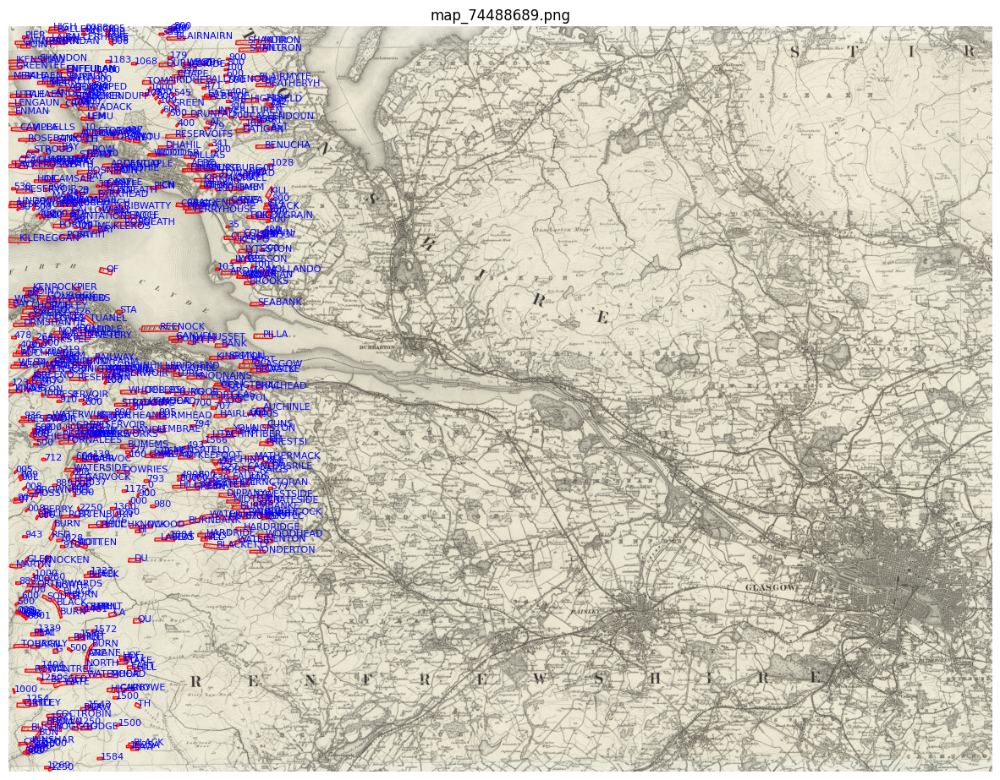

In [31]:
my_runner.show(
    parent_list[0], 
    figsize=(15, 15),
    border_color="r",
    text_color="b",
)

### Convert pixel bounds to coordinates

In [ ]:
geo_predictions = my_runner.convert_to_coords(return_dataframe=True)

Saving these outputs will give you a geojson file you can load into a GIS software.

In [ ]:
my_runner.save_to_geojson("./example_outputs.geojson")